# Normalizing activations in a network

So if you want to train the parameters, say w3, b3, then ,wouldn't it be nice if you can normalize the mean and variance of a2 to make the training of w3, b3 more efficient? In the case of logistic regression, we saw how normalizing x1, x2, x3 maybe helps you train w and b more efficiently. So here, the question is, for any hidden layer, can we normalize.The values of a, let's say a2, in this example but really any hidden layer, so as to train w3 b3 faster, right? Since a2 is the input to the next layer, that therefore affects your training of w3 and b3.So this is what batch norm does, batch normalization, or batch norm for short, does. Although technically, we'll actually normalize the values of not a2 but z2. 

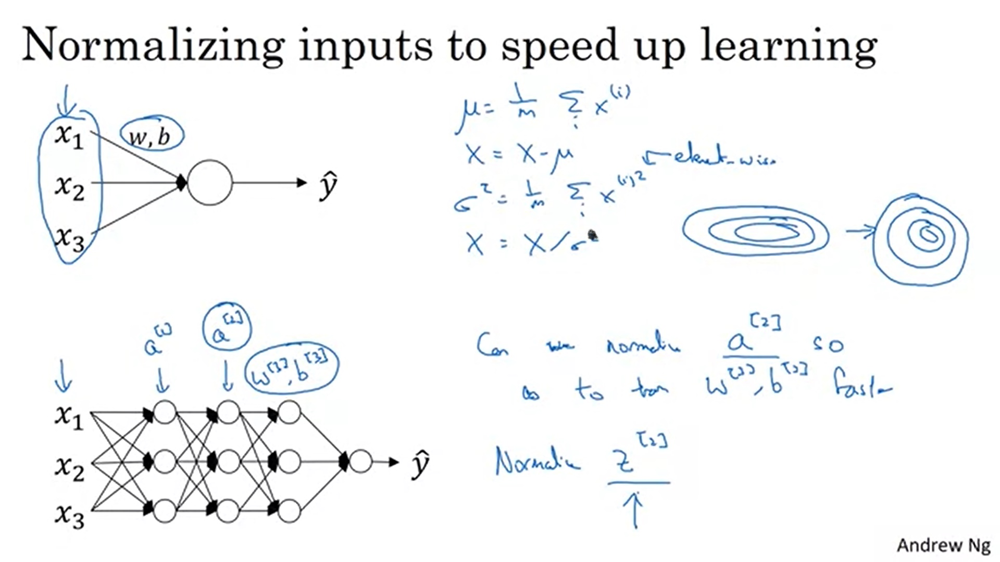

here are some debates in the deep learning literature about whether you should normalize the value before the activation function, so z2, or whether you should normalize the value after applying the activation function, a2. In practice, normalizing z2 is done much more often. So that's the version I'll present and what I would recommend you use as a default choice. So here is how you will implement batch norm.

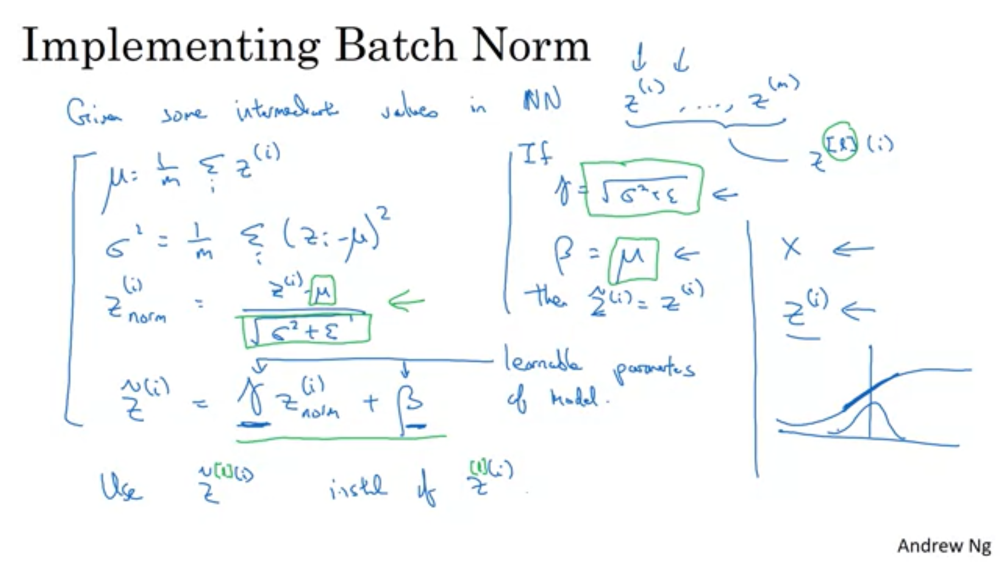

 But what it does really is it then shows that your hidden units have standardized mean and variance, where the mean and variance are controlled by two explicit parameters gamma and beta which the learning algorithm can set to whatever it wants. So what it really does is it normalizes in mean and variance of these hidden unit values, really the zis, to have some fixed mean and variance. And that mean and variance could be 0 and 1, or it could be some other value, and it's controlled by these parameters gamma and beta. 

# Fitting Batch Norm into a neural network

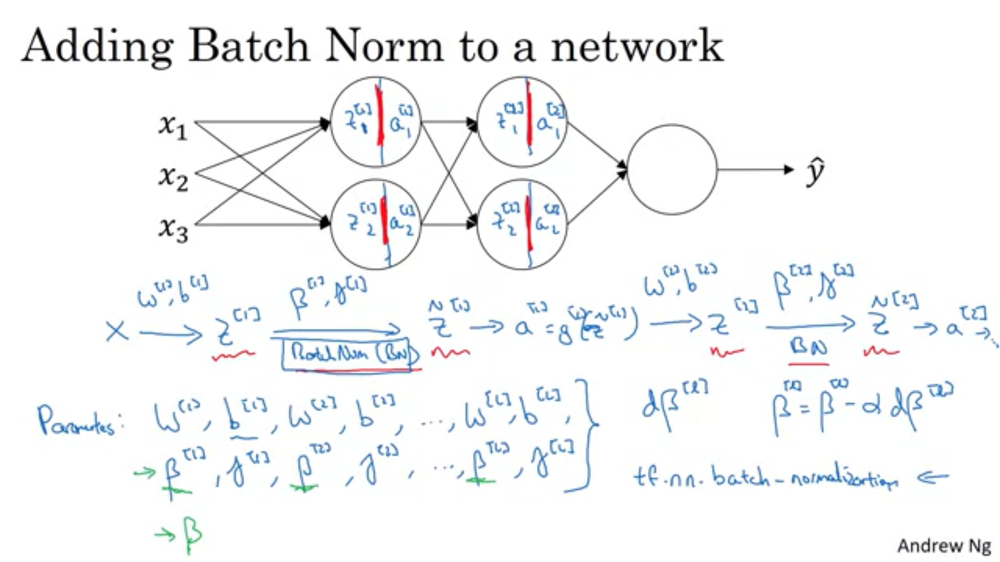

 So now that these are the new parameters of your algorithm, you would then use whether optimization you want, such as creating descent in order to implement it. For example, you might compute D Beta L for a given layer, and then update the parameters Beta, gets updated as Beta minus learning rate times D Beta L. And you can also use Adam or RMSprop or momentum in order to update the parameters Beta and Gamma, not just creating descent.

 In practice, Batch Norm is usually applied with mini-batches of your training set

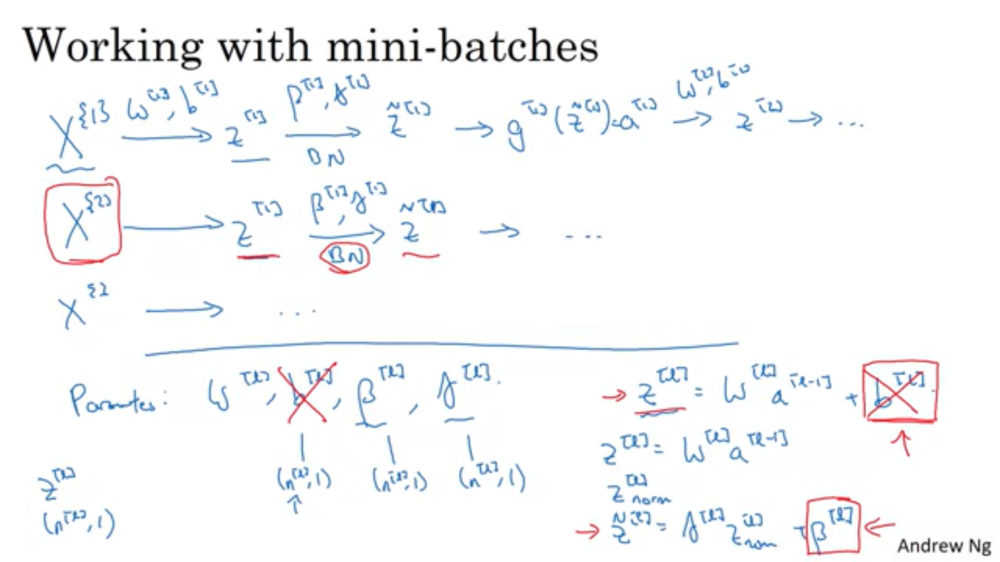

But what Batch Norm does, is it is going to look at the mini-batch and normalize ZL to first of mean 0 and standard variance, and then a rescale by Beta and Gamma. But what that means is that, whatever is the value of BL is actually going to just get subtracted out, because during that Batch Normalization step, you are going to compute the means of the ZL's and subtract the mean. `And so adding any constant to all of the examples in the mini-batch, it doesn't change anything. Because any constant you add will get cancelled out by the mean subtractions step. So, if you're using Batch Norm, you can actually eliminate that parameter, or if you want, think of it as setting it permanently to 0. `

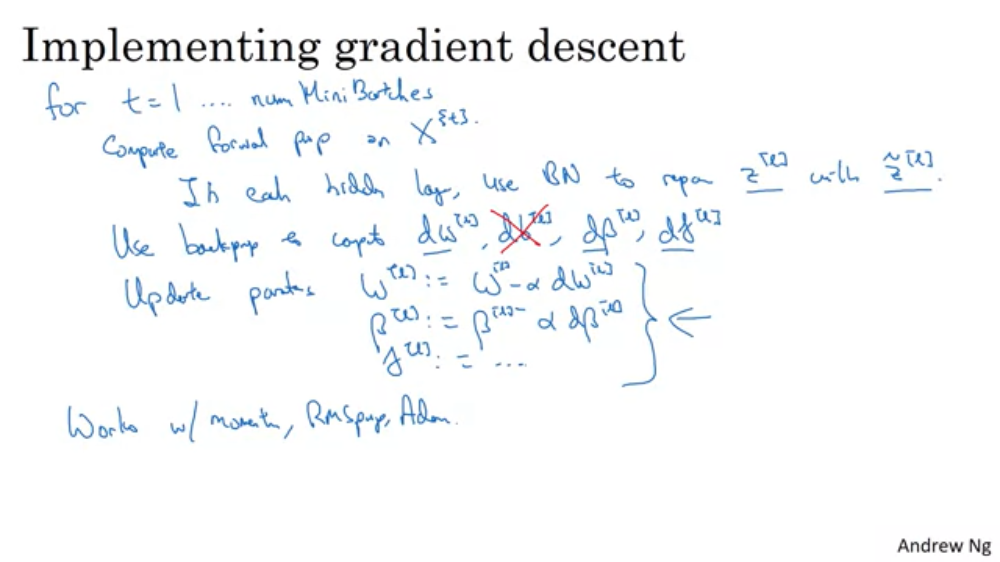

# Why does Batch Norm work?



So, why does batch norm work? Here's one reason, you've seen how normalizing the input features, the X's, to mean zero and variance one, how that can speed up learning. So rather than having some features that range from zero to one, and some from one to a 1,000, by normalizing all the features, input features X, to take on a similar range of values that can speed up learning. So, one intuition behind why batch norm works is, this is doing a similar thing, but further values in your hidden units and not just for your input there. 

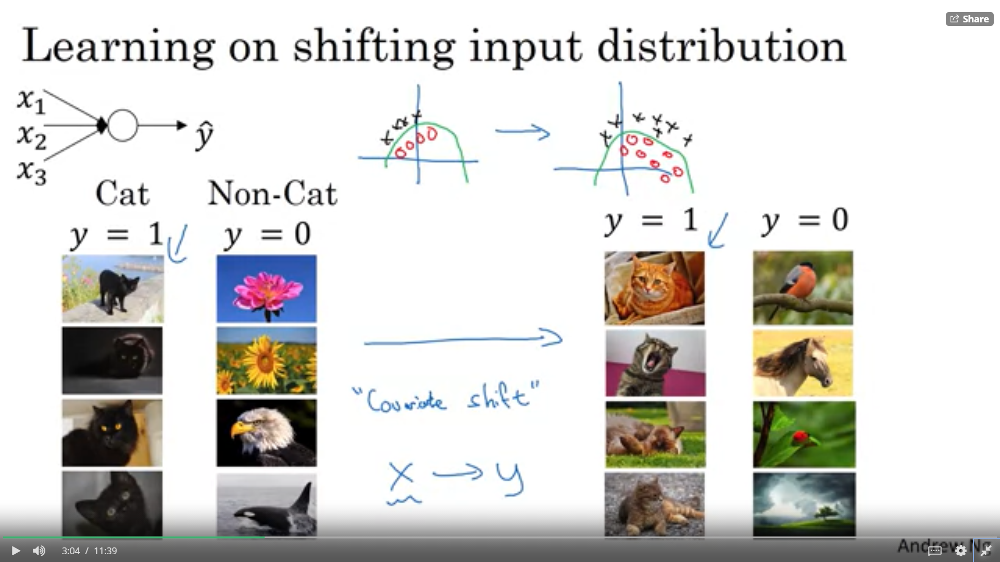

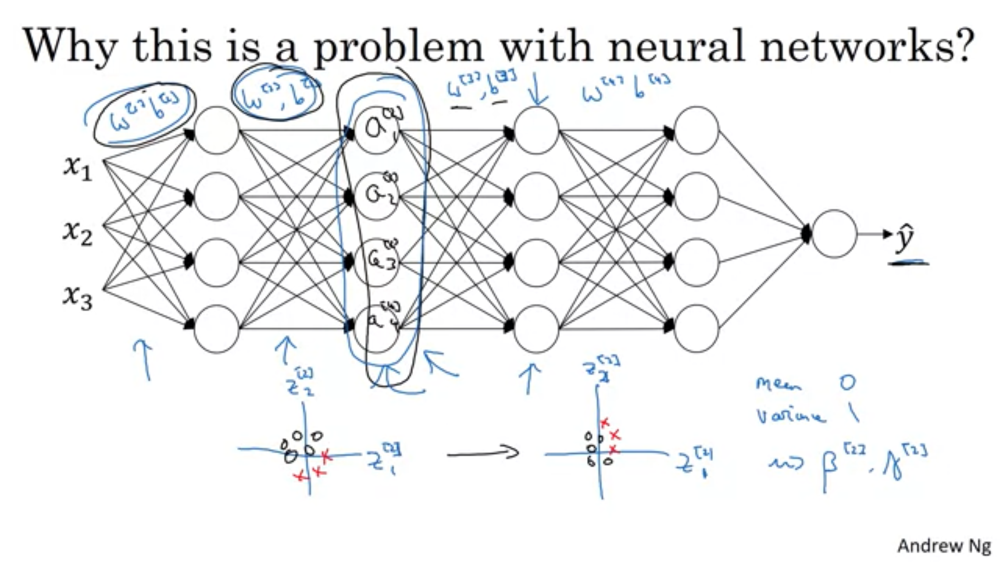

But what this does is, it limits the amount to which updating the parameters in the earlier layers can affect the distribution of values that the third layer now sees and therefore has to learn on. And so, batch norm reduces the problem of the input values changing, it really causes these values to become more stable, so that the later layers of the neural network has more firm ground to stand on. And even though the input distribution changes a bit, it changes less, and what this does is, even as the earlier layers keep learning, the amounts that this forces the later layers to adapt to as early as layer changes is reduced or, if you will, it weakens the coupling between what the early layers parameters has to do and what the later layers parameters have to do. `And so it allows each layer of the network to learn by itself, a little bit more independently of other layers, and this has the effect of speeding up of learning in the whole network. `

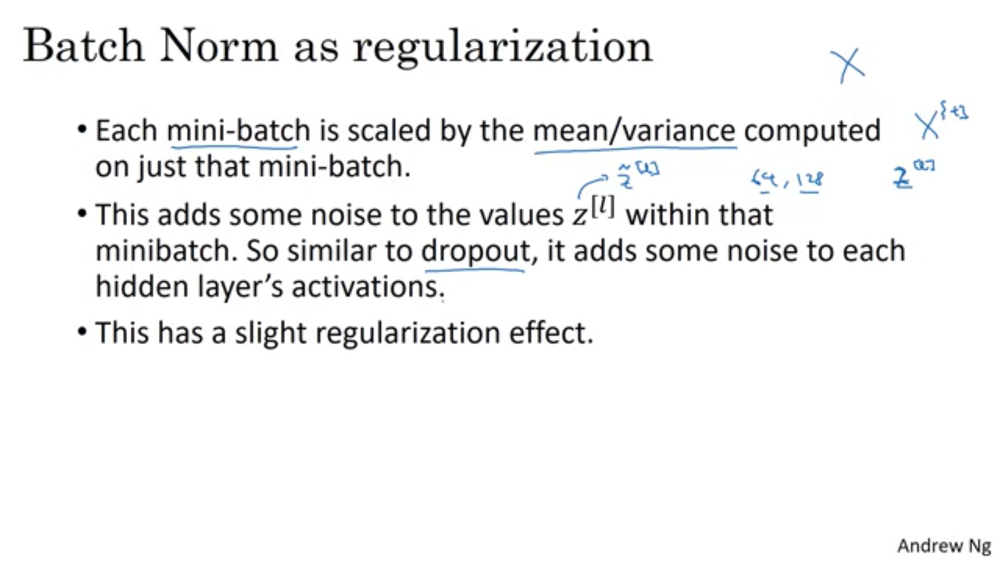

 Now, because the mean and variance computed on just that mini-batch as opposed to computed on the entire data set, that mean and variance has a little bit of noise in it, because it's computed just on your mini-batch of, say, 64, or 128, or maybe 256 or larger training examples. 

If you use a bigger mini-batch size, right, so if you use use a mini-batch size of, say, 512 instead of 64, by using a larger mini-batch size, you're reducing this noise and therefore also reducing this regularization effect. 

# Batch Norm at test time

Batch norm processes your data one mini batch at a time, but the test time you might need to process the examples one at a time. Let's see how you can adapt your network to do that. 

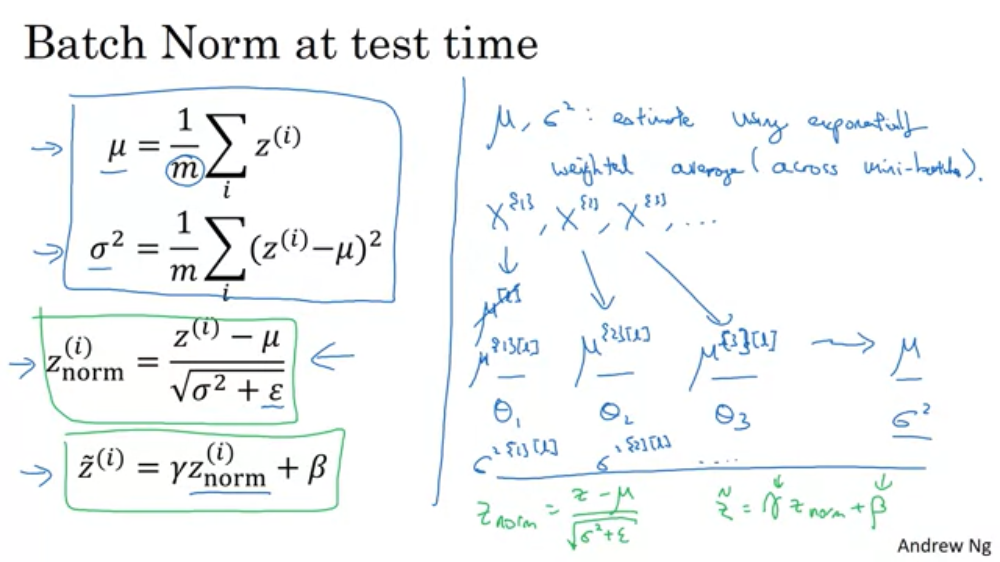

But in practice, what people usually do is implement and exponentially weighted average where you just keep track of the mu and sigma squared values you're seeing during training and use and exponentially the weighted average, also sometimes called the running average, to just get a rough estimate of mu and sigma squared and then you use those values of mu and sigma squared that test time to do the scale and you need the head and unit values Z. In practice, this process is pretty robust to the exact way you used to estimate mu and sigma squared. So, I wouldn't worry too much about exactly how you do this and if you're using a deep learning framework, they'll usually have some default way to estimate the mu and sigma squared that should work reasonably well as well.